In [2]:
import imgaug as ia
ia.seed(1)
# imgaug uses matplotlib backend for displaying images
%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug import augmenters as iaa 
# imageio library will be used for image input/output
import imageio
import pandas as pd
import numpy as np
import re
import os
import glob
# this library is needed to read XML files for converting it into CSV
import xml.etree.ElementTree as ET
import shutil

In [3]:
# load images as NumPy arrays and append them to images list
images_train = []
for index, file in enumerate(glob.glob('./train/images/*.png')):
    images_train.append(imageio.imread(file))
    
# how many images we have
print('We have {} images'.format(len(images_train)))

We have 2 images


In [4]:
# what are the sizes of the images
for index, file in enumerate(glob.glob('./train/images/*.png')):
    print('Image {} have size of {}'.format(file[2:], images_train[index].shape))

Image train/images/image_2_3.png have size of (1350, 2358, 3)
Image train/images/image_1_3.png have size of (1350, 2358, 3)


In [53]:
# image_1_3 = images[0]
# 
# image_1_3 = image_1_3[:,:,:3]
# 
# image_2_3 = images[1]
# 
# image_2_3 = image_2_3[:,:,:3]
# 
# image_3_3 = images[2]
# 
# image_3_3 = image_3_3[:,:,:3]
# 
# from PIL import Image
# image_1_3 = Image.fromarray(image_1_3)
# image_1_3.save("image_1_3.png")
# 
# image_2_3 = Image.fromarray(image_2_3)
# image_2_3.save("image_2_3.png")
# 
# image_3_3 = Image.fromarray(image_3_3)
# image_3_3.save("image_3_3.png")

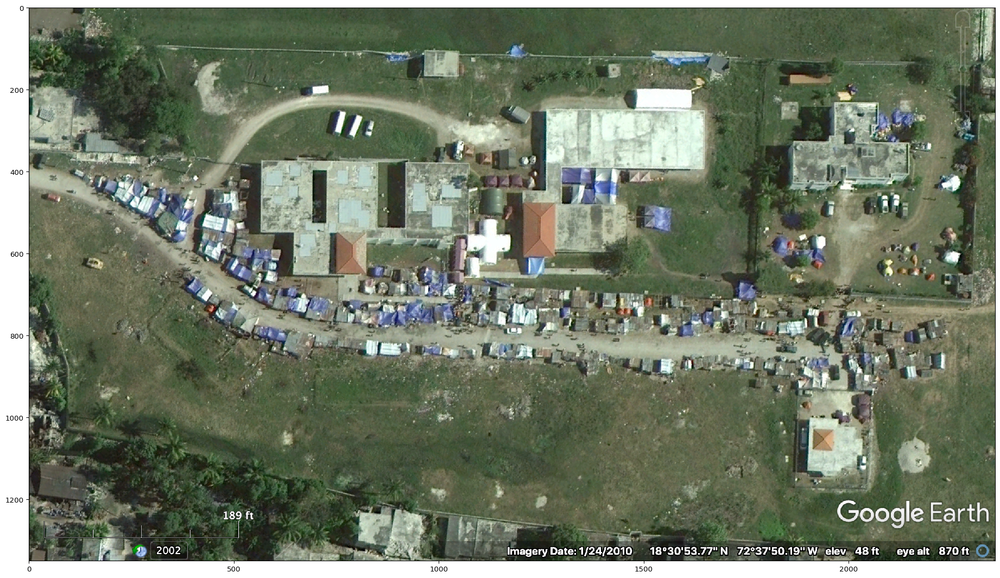

In [5]:
ia.imshow(images_train[1])

In [6]:
# XML file names correspond to the image file names
for index, file in enumerate(glob.glob('./train/annotations/*.xml')):
    print(file[1:])

/train/annotations/image_2_3.xml
/train/annotations/image_1_3.xml


In [124]:
## have a look how one of the XML annotation file looks like
## notice how it has 2 bounding boxes with red pandas
#shutil.copy('train/annotations/image_01_3.xml', 'train/annotations/image_01_3.txt')
#annotation_text = open("train/annotations/image_01_3.txt", "r")
#print(annotation_text.read())
#annotation_text.close()

In [7]:
# Function that will extract column data for our CSV file
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [8]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv
labels_train = xml_to_csv('train/annotations/')
labels_train.to_csv(('labels_train.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


In [9]:
# in the previuos cell we also put all annotation in labels_df
# let's see what's inside
# each bounding box has a separate row
labels_train

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image_7.png,2358,1350,tent,633,564,709,629
1,image_7.png,2358,1350,tent,663,290,711,346
2,image_7.png,2358,1350,tent,622,116,671,187
3,image_7.png,2358,1350,tent,667,116,704,187
4,image_7.png,2358,1350,tent,783,196,837,245
...,...,...,...,...,...,...,...,...
289,image_1.png,2358,1350,tent,1098,346,1135,387
290,image_1.png,2358,1350,tent,1055,331,1095,370
291,image_1.png,2358,1350,tent,2025,837,2062,874
292,image_1.png,2358,1350,tent,2058,794,2113,823


In [10]:
# start by groupping each image bounding boxes coordinates
# separate dataframes are formed based on the filename
grouped = labels_train.groupby('filename')

In [11]:
# we can pull each group with get_group() using the filename
group_df = grouped.get_group('image_1.png')
group_df = group_df.reset_index()
group_df = group_df.drop(['index'], axis=1)
group_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image_1.png,2358,1350,tent,180,417,220,456
1,image_1.png,2358,1350,tent,264,453,306,507
2,image_1.png,2358,1350,tent,313,494,364,563
3,image_1.png,2358,1350,tent,418,500,484,556
4,image_1.png,2358,1350,tent,377,650,427,704
...,...,...,...,...,...,...,...,...
139,image_1.png,2358,1350,tent,1098,346,1135,387
140,image_1.png,2358,1350,tent,1055,331,1095,370
141,image_1.png,2358,1350,tent,2025,837,2062,874
142,image_1.png,2358,1350,tent,2058,794,2113,823


In [12]:
# get bounding boxes coordinates from grouped data frame and write into array        
bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
# display the array we've got
# bb_array

In [17]:
# pass the array of bounding boxes coordinates to the imgaug library
bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=images_train[1].shape)
# display the image and draw bounding boxes
# ia.imshow(bbs.draw_on_image(image_1), size = 2)

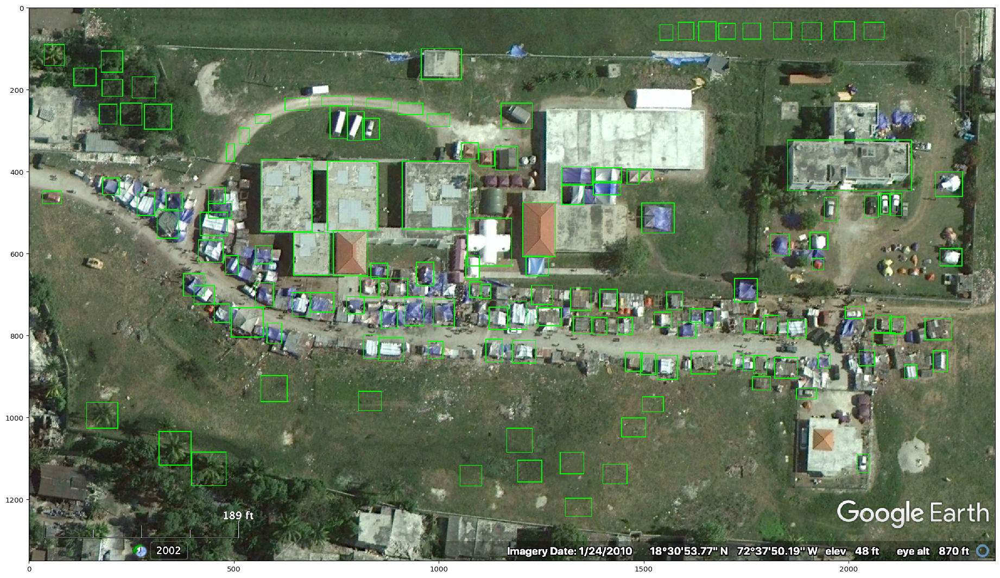

In [19]:
# display the image and draw bounding boxes
ia.imshow(bbs.draw_on_image(images_train[1], size = 2))

In [20]:
# we can pull each group with get_group() using the filename
group_df = grouped.get_group('image_7.png')
group_df = group_df.reset_index()
group_df = group_df.drop(['index'], axis=1)
group_df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image_7.png,2358,1350,tent,633,564,709,629
1,image_7.png,2358,1350,tent,663,290,711,346
2,image_7.png,2358,1350,tent,622,116,671,187
3,image_7.png,2358,1350,tent,667,116,704,187
4,image_7.png,2358,1350,tent,783,196,837,245
...,...,...,...,...,...,...,...,...
145,image_7.png,2358,1350,grass,1790,812,1856,888
146,image_7.png,2358,1350,grass,1566,824,1647,895
147,image_7.png,2358,1350,road,444,256,529,484
148,image_7.png,2358,1350,road,427,14,485,229


In [21]:
# get bounding boxes coordinates from grouped data frame and write into array        
bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
# display the array we've got
# bb_array

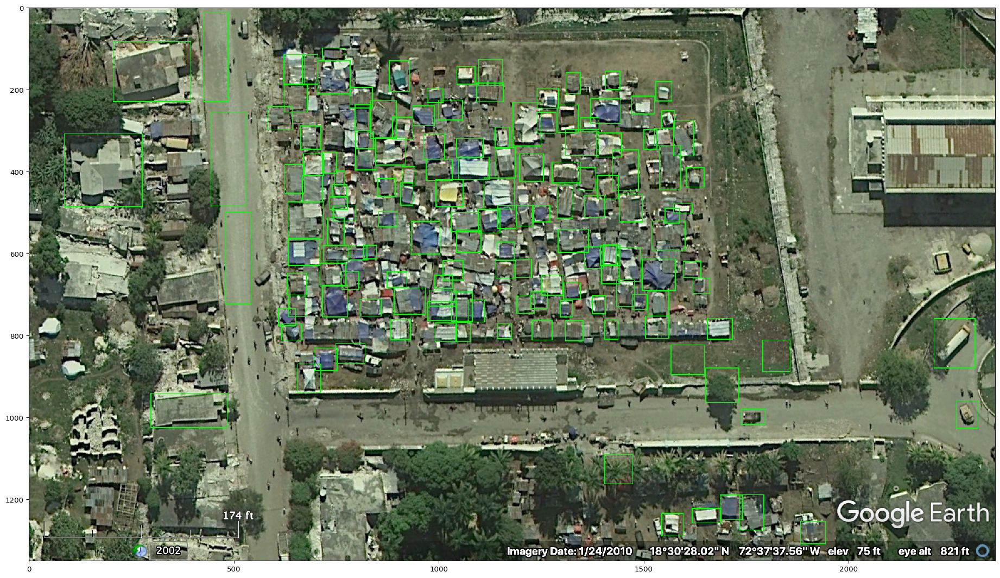

In [22]:
# pass the array of bounding boxes coordinates to the imgaug library
bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=images_train[0].shape)
# display the image and draw bounding boxes
train_bbs2 = ia.imshow(bbs.draw_on_image(images_train[0], size = 2))

In [109]:
pd.DataFrame(train_bbs2)

""


In [23]:
# load images as NumPy arrays and append them to images list
images_validation = []
for index, file in enumerate(glob.glob('./validation/images/*.png')):
    images_validation.append(imageio.imread(file))
    
# how many images we have
print('We have {} images'.format(len(images_validation)))

We have 4 images


In [24]:
# what are the sizes of the images
for index, file in enumerate(glob.glob('./validation/images/*.png')):
    print('Image {} have size of {}'.format(file[2:], images_validation[index].shape))

Image validation/images/image_04_3.png have size of (1350, 2358, 3)
Image validation/images/image_02_3.png have size of (1350, 2358, 3)
Image validation/images/image_05_3.png have size of (1350, 2358, 3)
Image validation/images/image_03_3.png have size of (1350, 2358, 3)


In [114]:
# image_02_3 = images[0]
#                    
# image_02_3 = image_02_3[:,:,:3]
# 
# image_03_3 = images[1]
# 
# image_03_3 = image_03_3[:,:,:3]
# 
# image_04_3 = images[2]
# 
# image_04_3 = image_04_3[:,:,:3]
# 
# image_05_3 = images[3]
# 
# image_05_3 = image_05_3[:,:,:3]
# 
# from PIL import Image
# image_02_3 = Image.fromarray(image_02_3)
# image_02_3.save("image_02_3.png")
# 
# image_03_3 = Image.fromarray(image_03_3)
# image_03_3.save("image_03_3.png")
# 
# image_04_3 = Image.fromarray(image_04_3)
# image_04_3.save("image_04_3.png")
# 
# image_05_3 = Image.fromarray(image_05_3)
# image_05_3.save("image_05_3.png")

In [25]:
# XML file names correspond to the image file names
for index, file in enumerate(glob.glob('./validation/annotations/*.xml')):
    print(file[1:])

/validation/annotations/image_04_3.xml
/validation/annotations/image_02_3.xml
/validation/annotations/image_05_3.xml
/validation/annotations/image_03_3.xml


In [26]:
# Function that will extract column data for our CSV file
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [27]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv
labels_validation = xml_to_csv('validation/annotations/')
labels_validation.to_csv(('labels_validation.csv'), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


In [30]:
# in the previuos cell we also put all annotation in labels_df
# let's see what's inside
# each bounding box has a separate row
labels_validation[labels_validation['filename'].str.contains('oogle')]

,filename,width,height,class,xmin,ymin,xmax,ymax
40,Legoane Haiti-3 2010 earthquake w-lat&long fro...,0,0,tent,1059,551,1128,618
41,Legoane Haiti-3 2010 earthquake w-lat&long fro...,0,0,tent,1142,577,1187,624
42,Legoane Haiti-3 2010 earthquake w-lat&long fro...,0,0,tent,1264,557,1321,626
43,Legoane Haiti-3 2010 earthquake w-lat&long fro...,0,0,tent,1250,712,1331,803
44,Legoane Haiti-3 2010 earthquake w-lat&long fro...,0,0,tent,1232,618,1271,651
...,...,...,...,...,...,...,...,...
98,Legoane Haiti-6 2010 earthquake w-lat&long fro...,2358,1350,tent,1197,250,1302,324
99,Legoane Haiti-6 2010 earthquake w-lat&long fro...,2358,1350,building,80,450,201,644
100,Legoane Haiti-6 2010 earthquake w-lat&long fro...,2358,1350,building,182,626,377,722
101,Legoane Haiti-6 2010 earthquake w-lat&long fro...,2358,1350,building,106,1,360,256
